In [1]:
#Importing required libraries,modules and checking versions
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import os, cv2
import tensorflow as tf
from tensorflow.keras.models import Sequential
from imblearn.over_sampling import RandomOverSampler 
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Conv2D, Flatten, Dense, MaxPool2D
# Import modules and check versions
import google
import glob
from sklearn.model_selection import cross_val_score
import itertools
import os
import pickle
import PIL
import seaborn as sns
from glob import glob
from google.colab import drive
from PIL import Image
from platform import python_version
from google.colab import drive
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, History
from keras.layers import Dense, Dropout
from tensorflow.keras.layers import BatchNormalization
from keras.metrics import categorical_accuracy
from keras.models import Sequential,Model,load_model
from tensorflow.keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.utils.np_utils import to_categorical
from numpy import expand_dims
from platform import python_version

%matplotlib inline

# Versions
print("Version Python:",python_version())
print()   
print("Version Matplotlib:",matplotlib.__version__)
print("Version NumPy:",np.__version__)
print("Version Pandas:",pd.__version__)
print("Version PIL:",PIL.__version__)
print("Version Seaborn:",sns.__version__)
print("Version TensorFlow:",tf.__version__)


Version Python: 3.10.11

Version Matplotlib: 3.7.1
Version NumPy: 1.22.4
Version Pandas: 1.5.3
Version PIL: 8.4.0
Version Seaborn: 0.12.2
Version TensorFlow: 2.12.0


In [2]:
!pip install imbalanced-learn --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import pandas as pd
metadata = pd.read_csv('/content/HAM10000_metadata.csv')
metadata.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


In [4]:
metadata.head(557)

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear
...,...,...,...,...,...,...,...
552,HAM_0005968,ISIC_0027355,bkl,histo,70.0,female,face
553,HAM_0004801,ISIC_0030365,bkl,histo,50.0,male,back
554,HAM_0000386,ISIC_0026787,bkl,histo,65.0,male,upper extremity
555,HAM_0001938,ISIC_0026245,bkl,histo,45.0,female,lower extremity


In [5]:
# Data inspection: outlier and missing data detection and handling
#Unique values per column 
for col in metadata:
    print(metadata[col].nunique(),"unique values in " + col + ":",np.sort(metadata[col].unique()))
print()
# Missing values ('NA' or 'unknown') 
print("Number of 'NA' in 'age':", metadata['age'].isna().sum())
print("Number of 'unknown' in 'sex':", len(metadata[metadata['sex']=='unknown']))
print("Number of 'unknown' in 'localization':", len(metadata[metadata['localization']=='unknown']))
print()

7470 unique values in lesion_id: ['HAM_0000000' 'HAM_0000001' 'HAM_0000002' ... 'HAM_0007626' 'HAM_0007627'
 'HAM_0007628']
10015 unique values in image_id: ['ISIC_0024306' 'ISIC_0024307' 'ISIC_0024308' ... 'ISIC_0034318'
 'ISIC_0034319' 'ISIC_0034320']
7 unique values in dx: ['akiec' 'bcc' 'bkl' 'df' 'mel' 'nv' 'vasc']
4 unique values in dx_type: ['confocal' 'consensus' 'follow_up' 'histo']
18 unique values in age: [ 0.  5. 10. 15. 20. 25. 30. 35. 40. 45. 50. 55. 60. 65. 70. 75. 80. 85.
 nan]
3 unique values in sex: ['female' 'male' 'unknown']
15 unique values in localization: ['abdomen' 'acral' 'back' 'chest' 'ear' 'face' 'foot' 'genital' 'hand'
 'lower extremity' 'neck' 'scalp' 'trunk' 'unknown' 'upper extremity']

Number of 'NA' in 'age': 57
Number of 'unknown' in 'sex': 57
Number of 'unknown' in 'localization': 234



In [6]:
# Drop instances where values 'sex', and 'localization' are all missing  
initial_length_metadata = len(metadata)
#age replaced using mean age
metadata['age'].fillna(metadata['age'].mean(),inplace=True)
metadata = metadata.drop(metadata[(metadata['localization'] == 'unknown') & (metadata['sex'] == 'unknown')].index)
# Missing values ('NA' or 'unknown') 
print("Number of 'NA' values in 'age' column :", metadata['age'].isna().sum())
print("Number of 'unknown' values in 'sex' column:", len(metadata[metadata['sex']=='unknown']))
print("Number of 'unknown' in 'localization'column :", len(metadata[metadata['localization']=='unknown']))
print()


Number of 'NA' values in 'age' column : 0
Number of 'unknown' values in 'sex' column: 10
Number of 'unknown' in 'localization'column : 187



In [7]:
# Percentage missing (after initial drop)
print("Number of instances with multiple missing values :",sum((len(metadata[(metadata['sex'] == 'unknown') & (metadata['localization'] == 'unknown')].index),len(metadata[(metadata['sex'] == 'unknown') & (metadata['age'].isna())].index),len(metadata[(metadata['localization'] == 'unknown') & (metadata['age'].isna())].index))))
print("Percentage of missing cases for 'age':", round((metadata['age'].isna().sum()/initial_length_metadata*100),1),"%")
print("Percentage of missing cases for 'localization':", round((len(metadata[metadata['localization'] == 'unknown'])/initial_length_metadata*100),1),"%")
print("Percentage of missing cases for 'sex':", round((len(metadata[metadata['sex'] == 'unknown'])/initial_length_metadata*100),1),"%")
print()
# Drop all remaining rows containing NA's (10) and rows containing value 'unknown' (10 + 187)  
metadata = metadata.dropna()
metadata = metadata[metadata.localization != 'unknown']
metadata = metadata[metadata.sex != 'unknown']
print("Percentage of complete cases:", round((len(metadata)/initial_length_metadata*100),1),"%")

Number of instances with multiple missing values : 0
Percentage of missing cases for 'age': 0.0 %
Percentage of missing cases for 'localization': 1.9 %
Percentage of missing cases for 'sex': 0.1 %

Percentage of complete cases: 97.6 %


In [8]:
# Creating dictionary to map lesion code with skin lesion type
lesion_classes_dict ={
    0:'akiec',
    1:'bcc',
    2:'bkl',
    3:'df',
    4:'nv',
    5:'mel',
    6:'vasc'
}
#Creating dictionary to determine full name of the skin lesion
lesions = {
    'akiec': 'Actinic keratoses',
    'bcc': 'Basal cell carcinoma',
    'bkl': 'Benign keratosis-like lesions ',
    'df': 'Dermatofibroma',
    'mel': 'Melanoma',
    'nv': 'Melanocytic nevi',
    'vasc': 'Vascular lesions'
}

#malignant skin lesion can cause cancer .
lesion_type = {
    'akiec': 'Malignant',
    'bcc': 'Malignant', 
    'bkl': 'Benign',
    'df': 'Benign',
    'mel': 'Malignant',
    'nv': 'Benign',
    'vasc': 'Benign'   
}

#Sun exposed and no-sun areas of the body
localizations = {
    'abdomen': 'No Sun',
    'acral': 'No Sun',
    'back': 'No Sun',
    'chest': 'No Sun',
    'ear': 'Sun',
    'face': 'Sun',
    'foot': 'No Sun',
    'genital': 'No Sun',
    'hand': 'Sun',
    'lower extremity': 'Sun',
    'neck': 'Sun',
    'scalp': 'Sun',
    'trunk': 'No Sun',
    'upper extremity': 'Sun'
}
     

In [9]:
metadata['Sex'] = pd.Categorical(metadata['sex']).codes
metadata['Detection_type']=pd.Categorical(metadata['dx_type']).codes
metadata['loc_group'] =metadata['localization'].map(localizations.get) 
metadata['Location'] = pd.Categorical(metadata['loc_group']).codes
metadata['lesion_type'] = metadata['dx'].map(lesion_type.get) 
metadata['type'] = pd.Categorical(metadata['lesion_type']).codes

In [10]:
metadata.head(900)

,lesion_id,image_id,dx,dx_type,age,sex,localization,Sex,Detection_type,loc_group,Location,lesion_type,type
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,1,3,Sun,1,Benign,0
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,1,3,Sun,1,Benign,0
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,1,3,Sun,1,Benign,0
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,1,3,Sun,1,Benign,0
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,1,3,Sun,1,Benign,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
904,HAM_0002462,ISIC_0025005,bkl,consensus,70.0,male,face,1,1,Sun,1,Benign,0
905,HAM_0005845,ISIC_0025851,bkl,consensus,80.0,female,face,0,1,Sun,1,Benign,0
906,HAM_0001991,ISIC_0028347,bkl,consensus,80.0,male,upper extremity,1,1,Sun,1,Benign,0
907,HAM_0005847,ISIC_0033460,bkl,consensus,85.0,male,face,1,1,Sun,1,Benign,0


In [11]:
data=metadata.drop(['lesion_id','image_id','dx','dx_type','sex','localization','lesion_type','loc_group'	], axis = 1)

In [12]:
data.head(2)


,age,Sex,Detection_type,Location,type
0,80.0,1,3,1,0
1,80.0,1,3,1,0


In [13]:
print('Min age',metadata['age'].min())
print('Max age',metadata['age'].max())

Min age 0.0
Max age 85.0


In [14]:
data.columns

Index(['age', 'Sex', 'Detection_type', 'Location', 'type'], dtype='object')

In [15]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np
# apply normalization techniques
cols=['age']
data[cols] = MinMaxScaler().fit_transform(data[cols])
#(np.array(metadata['age']).reshape(-1,1))

In [16]:
num_obs = len(data)
malignant = len(data.loc[data['type'] == 1])
benign= len(data.loc[data['type'] == 0])
print("Number of Malignant cases:  {0} ({1:2.2f}%)".format(malignant, ((1.00 * malignant)/(1.0 * num_obs)) * 100))
print("Number of Benign cases: {0} ({1:2.2f}%)".format(benign, (( 1.0 * benign)/(1.0 * num_obs)) * 100))

Number of Malignant cases:  1939 (19.84%)
Number of Benign cases: 7832 (80.16%)


In [17]:
data.head(2)

,age,Sex,Detection_type,Location,type
0,0.941176,1,3,1,0
1,0.941176,1,3,1,0


In [18]:
data.type.value_counts()

0    7832
1    1939
Name: type, dtype: int64

In [19]:
dataX =data.drop('type', axis=1)
dataY = data['type']

In [20]:
x_train, x_test, y_train, y_test = train_test_split(dataX,dataY,test_size=0.2,random_state=42)

In [21]:
print('x_train:' ,x_train.shape)
print('y_train:',y_train.shape)
print('x_test:',x_test.shape)
print('y_test:',y_test.shape)


x_train: (7816, 4)
y_train: (7816,)
x_test: (1955, 4)
y_test: (1955,)


In [22]:
import sklearn.ensemble

Some experiments-


In [23]:
values=[10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,200]

for i in values:
  print('for n_estimators:',i)
  rf2= sklearn.ensemble.RandomForestClassifier(n_estimators=i,max_depth=3)
  rf2.fit(x_train,y_train)
  print('Accuracy:',sklearn.metrics.accuracy_score(y_test,rf2.predict(x_test)))
  from sklearn.metrics import precision_score
  y_pred=rf2.predict(x_test)
  print("Precision score: {}".format(precision_score(y_test,y_pred,average='weighted')))
  from sklearn.metrics import recall_score
  print("Recall score: {}".format(recall_score(y_test,y_pred,average='weighted')))
  from sklearn.metrics import f1_score
  print("F1 score: {}".format(f1_score(y_test,y_pred,average='weighted')))
  print("\n")

for n_estimators: 10
Accuracy: 0.8092071611253197
Precision score: 0.8055756270471576
Recall score: 0.8092071611253197
F1 score: 0.8072823289720926


for n_estimators: 20
Accuracy: 0.8143222506393862
Precision score: 0.7881025686955808
Recall score: 0.8143222506393862
F1 score: 0.7802701137585608


for n_estimators: 30
Accuracy: 0.8158567774936062
Precision score: 0.7910747792768513
Recall score: 0.8158567774936062
F1 score: 0.7801372845275177


for n_estimators: 40
Accuracy: 0.818925831202046
Precision score: 0.7987485735072177
Recall score: 0.818925831202046
F1 score: 0.8016835848394633


for n_estimators: 50
Accuracy: 0.8158567774936062
Precision score: 0.7910747792768513
Recall score: 0.8158567774936062
F1 score: 0.7801372845275177


for n_estimators: 60
Accuracy: 0.8179028132992328
Precision score: 0.7938946100142897
Recall score: 0.8179028132992328
F1 score: 0.7895046565500661


for n_estimators: 70
Accuracy: 0.8122762148337596
Precision score: 0.7859543300774634
Recall score: 0.

In [24]:
pip install yellowbrick --user

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


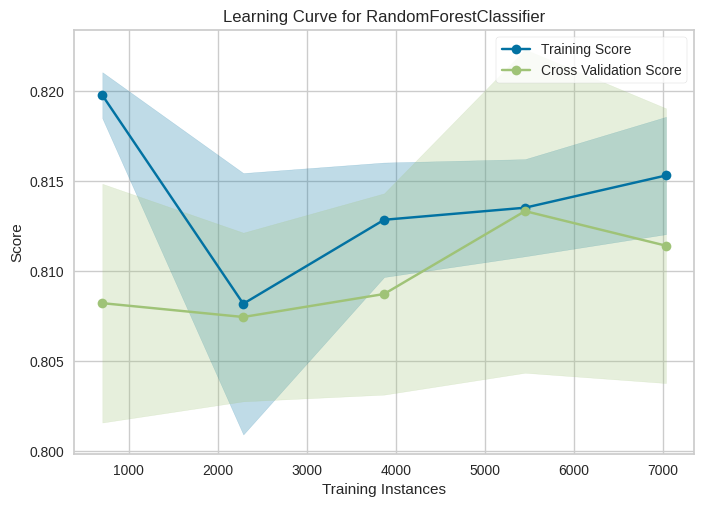

ValueError: ignored

In [25]:
from sklearn.ensemble import RandomForestClassifier
from yellowbrick.model_selection import learning_curve
rfc = RandomForestClassifier(n_estimators=100, max_depth=3, random_state=0)
print(learning_curve(rfc, x_train, y_train, cv=10, scoring='accuracy'))

In [26]:
from pprint import pprint
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(rfc.get_params())


Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 3,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 0,
 'verbose': 0,
 'warm_start': False}


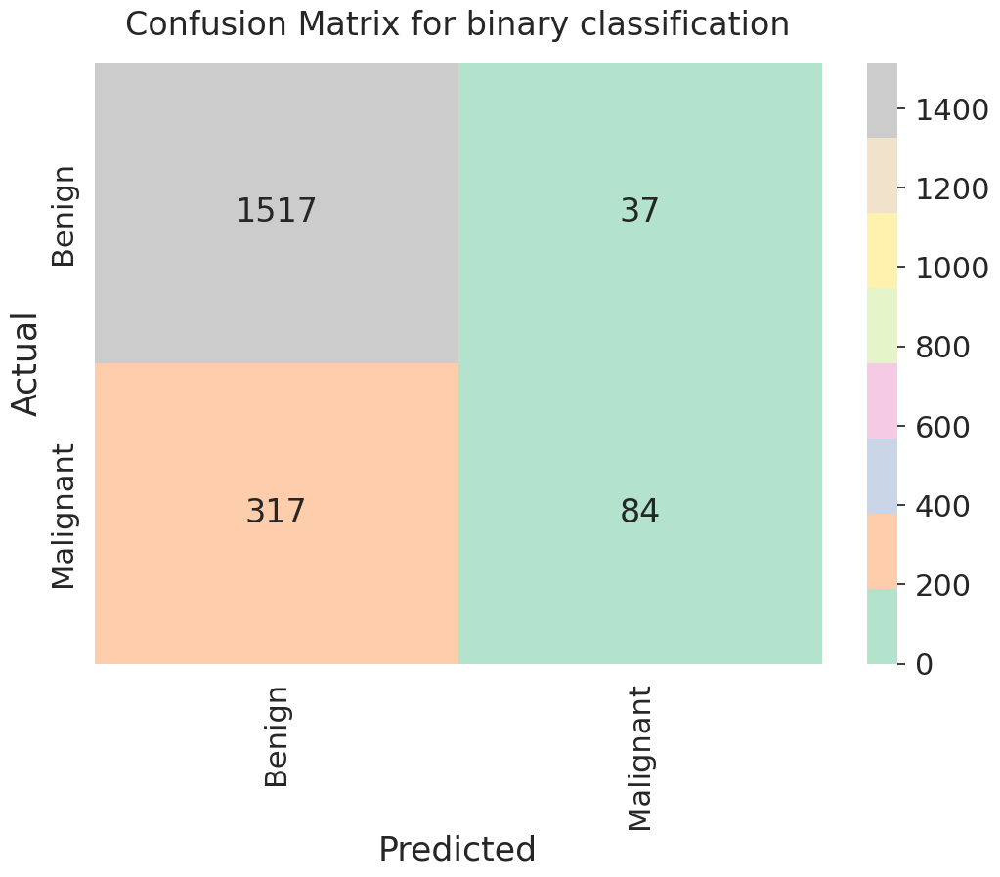

In [27]:
lesion_types=['Benign','Malignant']
from sklearn.metrics import confusion_matrix
conf_matrix = pd.DataFrame(confusion_matrix(y_test,y_pred),columns = lesion_types, index = lesion_types)
plt.figure(figsize=(12,8))
sns.set(font_scale=2.0)
ax = sns.heatmap(conf_matrix, annot = True, fmt = 'g' ,vmin = 0,cmap = 'Pastel2')
ax.set_xlabel('Predicted',fontsize = 25)
ax.set_xticklabels(ax.get_xticklabels(),rotation =90);
ax.set_ylabel('Actual',fontsize =25)    
ax.set_title('Confusion Matrix for binary classification',fontsize =24,pad=20);
filename = 'Confusion Matrix(binary)'
plt.savefig(os.path.join('/content',filename), dpi=600)
plt.show()

In [28]:
from sklearn.metrics import classification_report
print(classification_report( y_test,y_pred))

              precision    recall  f1-score   support

           0       0.83      0.98      0.90      1554
           1       0.69      0.21      0.32       401

    accuracy                           0.82      1955
   macro avg       0.76      0.59      0.61      1955
weighted avg       0.80      0.82      0.78      1955



Undersampling

In [29]:
y_train.shape

(7816,)

In [30]:
# import random undersampling and other necessary libraries 
from collections import Counter
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
from sklearn.svm import SVC
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [31]:
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import roc_auc_score
 # Statistic the proportion of current categories
print("Before undersampling: ", Counter(y_train))
 
 # Call method for undersampling
undersample = RandomUnderSampler(sampling_strategy='majority')
 
 # Obtain samples after undersampling
x_train_under, y_train_under = undersample.fit_resample(x_train, y_train)
 
 # Statistics of the proportion of categories after under-sampling
print("After undersampling: ", Counter(y_train_under))
 
 # Calling the support vector machine algorithm SVC
model=SVC(probability=True)
 
clf = model.fit(x_train, y_train)
pred = clf.predict(x_test)
print("ROC AUC score for original data: ", roc_auc_score(y_test, pred))
 
clf_under = model.fit(x_train_under, y_train_under)
pred_under = clf_under.predict(x_test)
print("ROC AUC score for undersampled data: ", roc_auc_score(y_test, pred_under))

Before undersampling:  Counter({0: 6278, 1: 1538})
After undersampling:  Counter({0: 1538, 1: 1538})
ROC AUC score for original data:  0.6266613068358703
ROC AUC score for undersampled data:  0.8061851484544751


In [32]:
sklearn.metrics.accuracy_score(y_test,clf.predict(x_test))

0.69923273657289

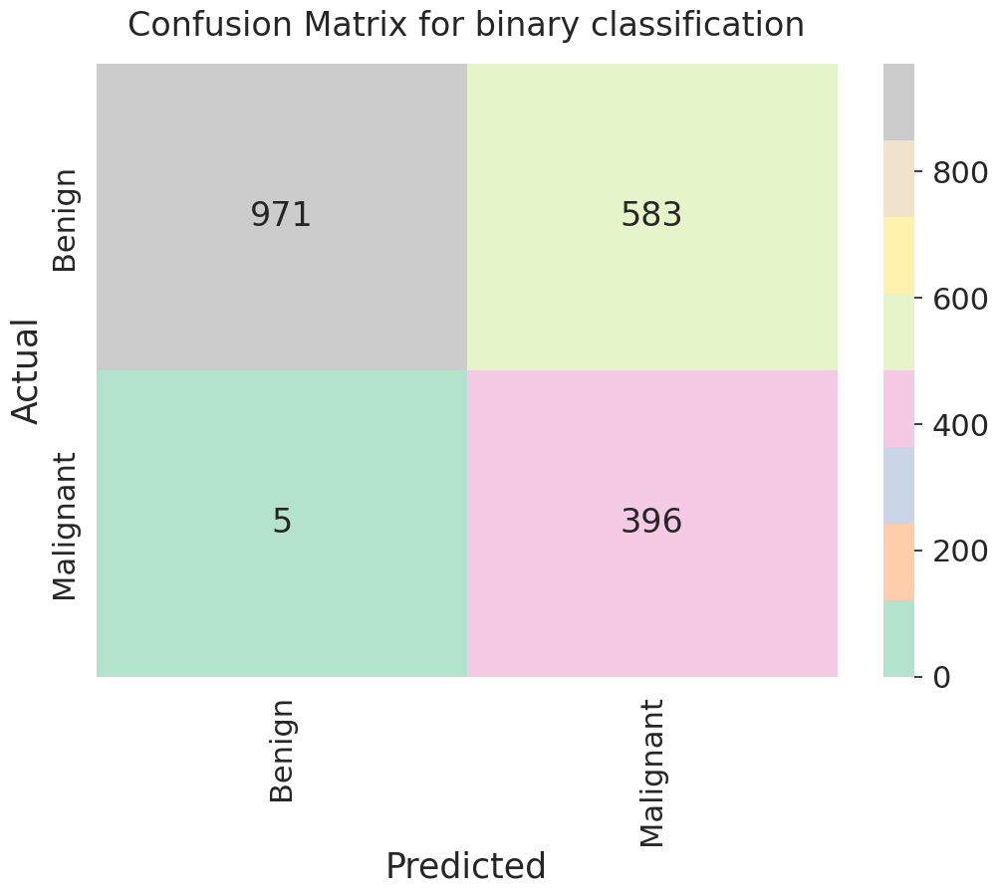

In [33]:
lesion_types=['Benign','Malignant']
from sklearn.metrics import confusion_matrix
conf_matrix = pd.DataFrame(confusion_matrix(y_test,pred_under),columns = lesion_types, index = lesion_types)
plt.figure(figsize=(12,8))
sns.set(font_scale=2.0)
ax = sns.heatmap(conf_matrix, annot = True, fmt = 'g' ,vmin = 0,cmap = 'Pastel2')
ax.set_xlabel('Predicted',fontsize = 25)
ax.set_xticklabels(ax.get_xticklabels(),rotation =90);
ax.set_ylabel('Actual',fontsize =25)    
ax.set_title('Confusion Matrix for binary classification',fontsize =24,pad=20);
filename = 'Confusion Matrix(binary)'
plt.savefig(os.path.join('/content',filename), dpi=600)
plt.show()

In [34]:
from sklearn.metrics import classification_report
print(classification_report( y_test,pred_under))

              precision    recall  f1-score   support

           0       0.99      0.62      0.77      1554
           1       0.40      0.99      0.57       401

    accuracy                           0.70      1955
   macro avg       0.70      0.81      0.67      1955
weighted avg       0.87      0.70      0.73      1955



In [35]:
  rfc = sklearn.ensemble.RandomForestClassifier(n_estimators=100,max_depth=3)
  rfc.fit(x_train,y_train)

RandomForestClassifier(max_depth=3)

In [36]:
from imblearn.over_sampling import RandomOverSampler
from sklearn.metrics import roc_auc_score
 # Statistic the proportion of current categories
print("Before oversampling: ", Counter(y_train))
 
oversample = RandomOverSampler(sampling_strategy='auto')

X_train_over, y_train_over = oversample.fit_resample(x_train, y_train)
 

print("After oversampling: ", Counter(y_train_over))
 

model=SVC(probability=True)
 
clf = model.fit(x_train, y_train)
pred = clf.predict(x_test)
print("ROC AUC score for original data: ", roc_auc_score(y_test, pred))
 
clf_over = model.fit(X_train_over, y_train_over)
pred_over = clf_over.predict(x_test)
print("ROC AUC score for undersampled data: ", roc_auc_score(y_test, pred_over))

Before oversampling:  Counter({0: 6278, 1: 1538})
After oversampling:  Counter({0: 6278, 1: 6278})
ROC AUC score for original data:  0.6266613068358703
ROC AUC score for undersampled data:  0.8166408303565411


In [37]:
sklearn.metrics.accuracy_score(y_test,clf.predict(x_test))

0.7335038363171356

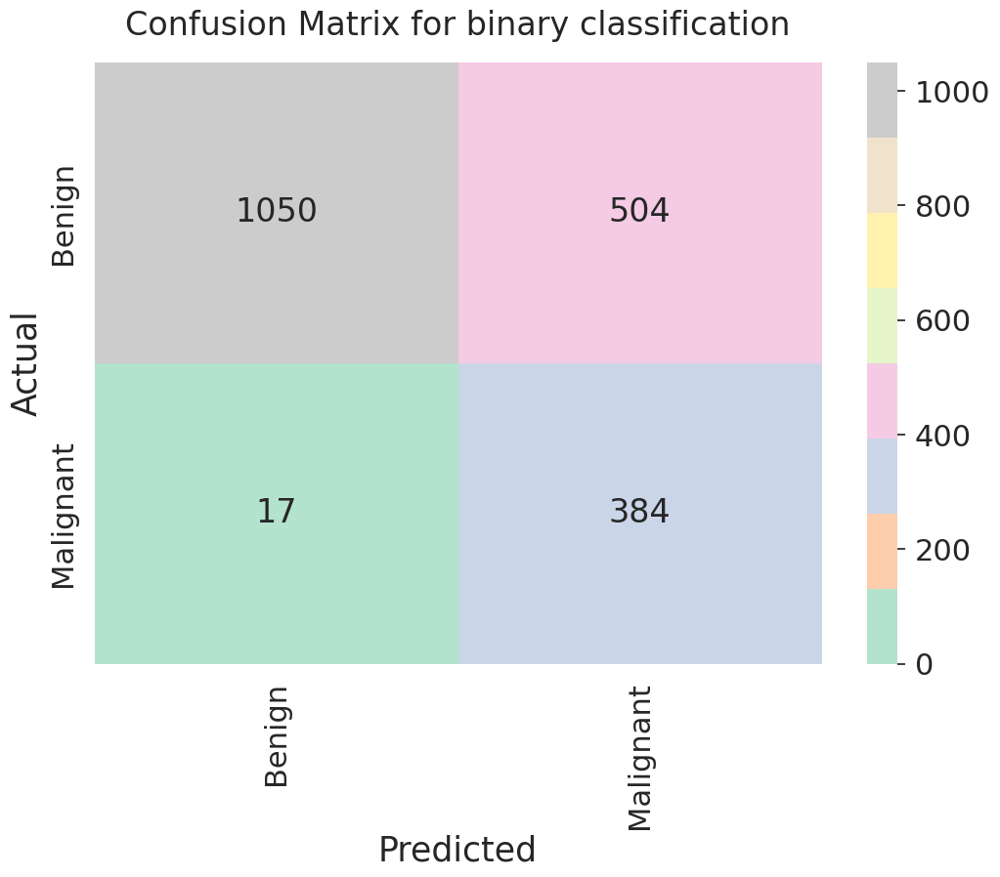

In [38]:
lesion_types=['Benign','Malignant']
from sklearn.metrics import confusion_matrix
conf_matrix = pd.DataFrame(confusion_matrix(y_test,pred_over),columns = lesion_types, index = lesion_types)
plt.figure(figsize=(12,8))
sns.set(font_scale=2.0)
ax = sns.heatmap(conf_matrix, annot = True, fmt = 'g' ,vmin = 0,cmap = 'Pastel2')
ax.set_xlabel('Predicted',fontsize = 25)
ax.set_xticklabels(ax.get_xticklabels(),rotation =90);
ax.set_ylabel('Actual',fontsize =25)    
ax.set_title('Confusion Matrix for binary classification',fontsize =24,pad=20);
filename = 'Confusion Matrix(binary)'
plt.savefig(os.path.join('/content',filename), dpi=600)
plt.show()

In [39]:
from sklearn.metrics import classification_report
print(classification_report( y_test,pred_over))

              precision    recall  f1-score   support

           0       0.98      0.68      0.80      1554
           1       0.43      0.96      0.60       401

    accuracy                           0.73      1955
   macro avg       0.71      0.82      0.70      1955
weighted avg       0.87      0.73      0.76      1955



In [40]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=3e06c1a094fab52a5968cd4dca2c70c88d50102e404b34bdb0edfd6fb166282f
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [41]:
import lime
from lime import lime_tabular
 
explainer = lime_tabular.LimeTabularExplainer(training_data=np.array(x_train),feature_names=dataX.columns,class_names=['Benign','Malignant'],
                                              mode='classification',discretize_continuous=True)

In [42]:
# Use LIME to explain the predictions on a test instance
import lime
from lime import lime_tabular

# Initialize the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(training_data=np.array(x_train), feature_names=dataX.columns, class_names=['Benign','Malignant'], mode='classification')
i=1502
# Select a test instance to explain
test_instance = x_test.loc[i]
if(y_test[i]==0):
  print("Actual Class: Benign")
else:
  print("Actual Class: Malignant")
# Get the predicted class label for the test instance
predicted_class = rfc.predict([test_instance])[0]
if(predicted_class==0):
  print("Predicted Class: Benign")
else:
  print("Predicted Class: Malignant")

# Use LIME to explain the prediction for the test instance
explanation = explainer.explain_instance(test_instance, rfc.predict_proba, num_features=10, top_labels=1)

explanation.show_in_notebook(show_all=False)


Actual Class: Malignant
Predicted Class: Benign


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [80]:
# Use LIME to explain the predictions on a test instance
import lime
from lime import lime_tabular
import warnings
warnings.filterwarnings('ignore')
# Initialize the LIME explainer
explainer = lime_tabular.LimeTabularExplainer(training_data=np.array(x_train), feature_names=dataX.columns, class_names=['Benign','Malignant'], mode='classification')
i=1162
# Select a test instance to explain
test_instance = x_test.loc[i]
if(y_test[i]==0):
  print("Actual Class: Benign")
else:
  print("Actual Class: Malignant")
# Get the predicted class label for the test instance
predicted_class = rfc.predict([test_instance])[0]
if(predicted_class==0):
  print("Predicted Class: Benign")
else:
  print("Predicted Class: Malignant")

# Use LIME to explain the prediction for the test instance
explanation = explainer.explain_instance(test_instance, rfc.predict_proba, num_features=10, top_labels=1)

explanation.show_in_notebook(show_all=False)


Actual Class: Benign
Predicted Class: Benign


In [45]:
for i in range(len(x_test)):
    print("Instance: ", i)
    print("Actual Class: ", y_test.iloc[i])
    print("Predicted Class: ", rfc.predict(x_test)[i])
    print("Probability (Malignant): ", rfc.predict_proba(x_test)[i][1])
    print("\n")

Streaming output truncated to the last 5000 lines.


Instance:  1122
Actual Class:  0
Predicted Class:  0
Probability (Malignant):  0.46371852871262786


Instance:  1123
Actual Class:  0
Predicted Class:  0
Probability (Malignant):  0.020494130854062962


Instance:  1124
Actual Class:  0
Predicted Class:  0
Probability (Malignant):  0.014057481279964671


Instance:  1125
Actual Class:  1
Predicted Class:  0
Probability (Malignant):  0.4167951838584992


Instance:  1126
Actual Class:  1
Predicted Class:  0
Probability (Malignant):  0.33729450390237503


Instance:  1127
Actual Class:  0
Predicted Class:  0
Probability (Malignant):  0.07899024401915983


Instance:  1128
Actual Class:  1
Predicted Class:  1
Probability (Malignant):  0.5059418714589725


Instance:  1129
Actual Class:  0
Predicted Class:  0
Probability (Malignant):  0.0346452855142838


Instance:  1130
Actual Class:  0
Predicted Class:  0
Probability (Malignant):  0.01740743816884023


Instance:  1131
Actual Class:  0
Predic

In [46]:
y_test.head(2900)

8473    0
2553    1
5172    0
4528    0
8880    0
       ..
9720    1
1729    1
1409    1
184     0
6262    0
Name: type, Length: 1955, dtype: int8

In [47]:
metadata.loc[1555]

lesion_id          HAM_0000611
image_id          ISIC_0033216
dx                         mel
dx_type                  histo
age                       30.0
sex                     female
localization              back
Sex                          0
Detection_type               3
loc_group               No Sun
Location                     0
lesion_type          Malignant
type                         1
Name: 1555, dtype: object

In [48]:
print(data.loc[4000])
print("\n")
print('Skin lesion is', metadata.loc[4000]['lesion_type'])

age               0.941176
Sex               1.000000
Detection_type    2.000000
Location          1.000000
type              0.000000
Name: 4000, dtype: float64


Skin lesion is Benign


In [49]:
exp = explainer.explain_instance(data_row=dataX.iloc[2553], predict_fn = clf.predict_proba)
exp.show_in_notebook(show_table=True,show_all=False)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


In [50]:
# Use LIME to explain the predictions on a test instance
import lime
from lime import lime_tabular

explainer = lime_tabular.LimeTabularExplainer(training_data=np.array(x_train), feature_names=dataX.columns, class_names=['Benign','Malignant'], mode='classification')
i=1841
test_instance= x_test.iloc[i]
if(y_test.iloc[i]==0):
  print("Actual Class: Benign")
else:
  print("Actual Class: Malignant")
# Get the predicted class label for the test instance
predicted_class = rfc.predict([test_instance])[0]
if(predicted_class==0):
  print("Predicted Class: Benign")
else:
  print("Predicted Class: Malignant")
explanation = explainer.explain_instance(test_instance, rfc.predict_proba, num_features=10, top_labels=1)
explanation.show_in_notebook(show_all=False)


Actual Class: Malignant
Predicted Class: Malignant


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


for instance 460

In [51]:
y_test.iloc[460]

0

In [52]:
i=460
print(x_test.iloc[i])

age               0.294118
Sex               1.000000
Detection_type    3.000000
Location          1.000000
Name: 7124, dtype: float64


for instance ,say 1200

In [53]:
X_new= x_test.loc[1200,:].to_numpy().reshape(1,-1)

In [54]:
new_prediction = rfc.predict(X_new)
print("Prediction of the model is class: {}".format(new_prediction))

Prediction of the model is class: [0]


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


In [55]:
print('Actual class:',y_test.iloc[1200])

Actual class: 0


In [56]:
i=1200
x_test.iloc[1200]

age               0.764706
Sex               1.000000
Detection_type    2.000000
Location          0.000000
Name: 5469, dtype: float64

In [57]:
exp = explainer.explain_instance(data_row=x_test.iloc[1200], predict_fn = clf.predict_proba)
exp.show_in_notebook(show_table=True,show_all=False)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


For Malignant Instance-

In [58]:
i=700
x_test.iloc[700]

age               0.941176
Sex               1.000000
Detection_type    3.000000
Location          0.000000
Name: 2762, dtype: float64

In [59]:
x_test.head(10)

,age,Sex,Detection_type,Location
8473,0.588235,1,3,0
2553,0.764706,0,3,1
5172,0.411765,1,2,1
4528,0.647059,1,2,0
8880,0.411765,0,3,1
2980,0.529412,0,2,0
6676,0.529412,0,2,0
630,0.529412,0,3,0
1098,0.647059,1,3,1
5329,0.882353,1,2,0


In [60]:
import warnings
warnings.filterwarnings('ignore')
j=1500
X_new_two = x_test.loc[j,:].to_numpy().reshape(1,-1)
new_prediction = rfc.predict(X_new_two)
print("Prediction of the model is class:",new_prediction)
print('Actual class:',y_test.loc[j])
exp = explainer.explain_instance(data_row=x_test.loc[j], predict_fn = clf.predict_proba)
exp.show_in_notebook(show_table=True,show_all=False)

Prediction of the model is class: [0]
Actual class: 1


In [61]:
import warnings
warnings.filterwarnings('ignore')
k=1200
X_new_two= x_test.loc[k,:].to_numpy().reshape(1,-1)
new_prediction = rfc.predict(X_new_two)
print("Prediction of the model is class:",new_prediction)
print('Actual class:',y_test.loc[k])
exp = explainer.explain_instance(data_row=x_test.loc[k], predict_fn = clf.predict_proba)
exp.show_in_notebook(show_table=True,show_all=False)

Prediction of the model is class: [0]
Actual class: 0


*for reference -https://pythonawesome.com/lime-explaining-the-predictions-of-any-machine-learning-classifier/*

SHAP

In [62]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 10.0 MB/s eta 0:00:00


In [63]:
import xgboost
import shap
shap.initjs()

In [64]:
import sklearn

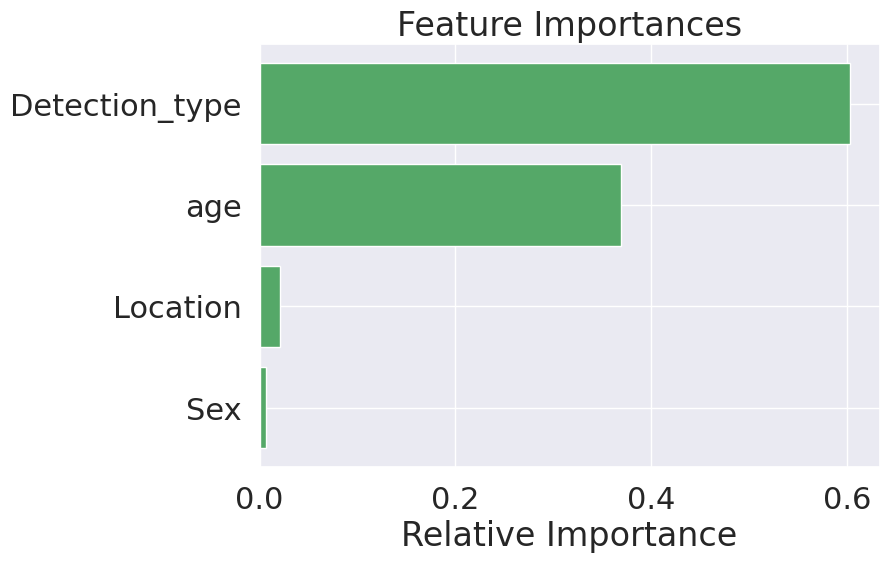

In [65]:
importances = rfc.feature_importances_
indices = np.argsort(importances)
features = data.columns
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='g', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [66]:
# compute SHAP values
explainer = shap.TreeExplainer(rfc)
shap_values = explainer.shap_values(dataX)

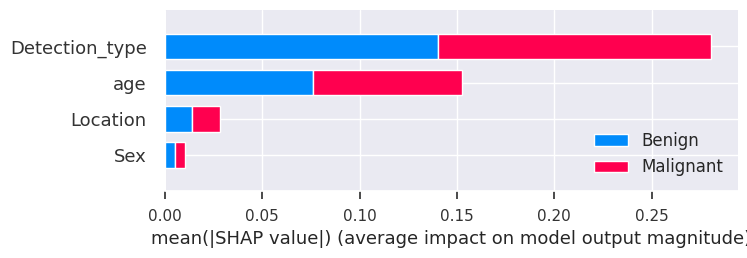

In [67]:
shap.summary_plot(shap_values, dataX.values, plot_type="bar", class_names= ['Benign','Malignant'], feature_names = dataX.columns)

class benign and malignnant hardly uses the features location and sex. We can also see that the classes benign and maignant uses the same features equally.

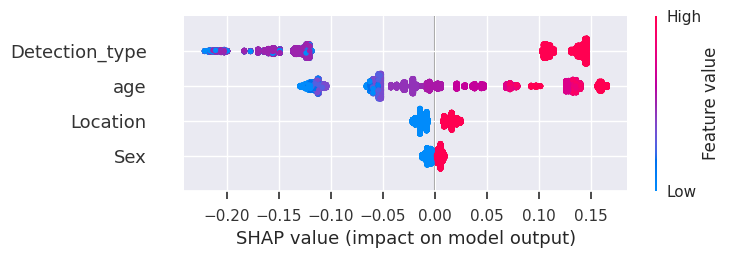

In [68]:
shap.summary_plot(shap_values[1], dataX.values, feature_names = dataX.columns)

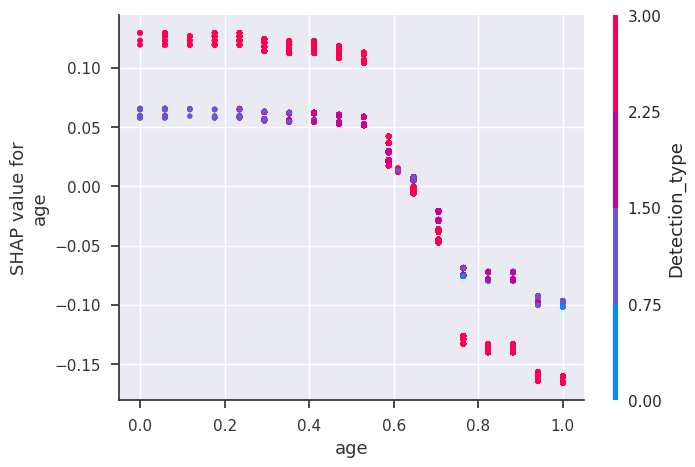

In [69]:
# If we pass a numpy array instead of a data frame then we
# need pass the feature names in separately
shap.dependence_plot(0, shap_values[0], dataX.values, feature_names=dataX.columns)

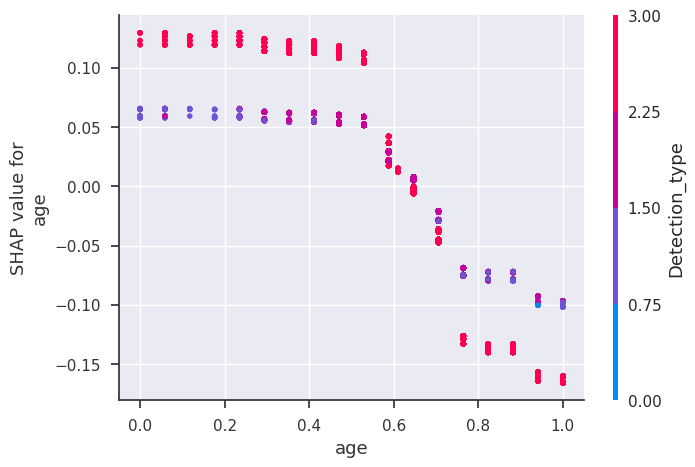

In [70]:
# If we pass a numpy array instead of a data frame then we
# need pass the feature names in separately
shap.dependence_plot(0, shap_values[0], dataX.values, feature_names=dataX.columns)

In [71]:
def shap_plot(j):
    explainerModel = shap.TreeExplainer(rfc)
    shap_values_Model = explainerModel.shap_values(x_test)
    p = shap.force_plot(explainerModel.expected_value[0], shap_values_Model[0][j], x_test.iloc[[j]], matplotlib = True, show = False)
    plt.savefig('/content/tmp.svg')
    plt.close()
    return(p)

In [72]:
y_test.head(40)

8473    0
2553    1
5172    0
4528    0
8880    0
2980    0
6676    0
630     0
1098    0
5329    0
7735    0
3059    0
6909    0
6911    0
4500    0
5463    0
6406    0
5179    0
350     0
539     0
7705    0
3069    0
8005    0
5618    0
6289    0
8344    0
801     0
2901    1
7782    0
3636    0
9047    0
4046    0
6578    0
2733    1
1625    1
6352    0
6741    0
3168    0
8940    0
7998    0
Name: type, dtype: int8

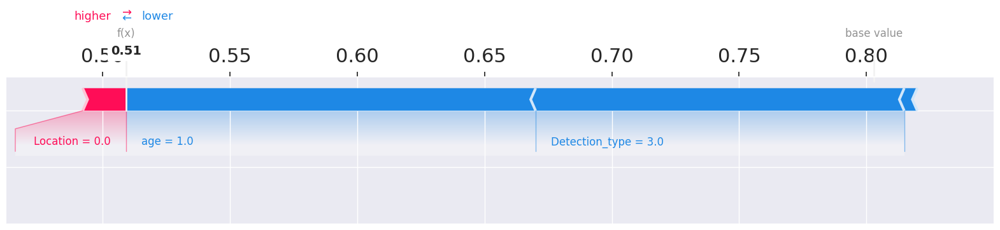

In [73]:
shap_plot(1749)

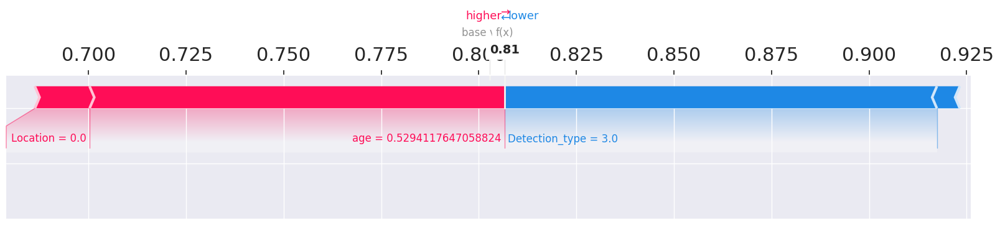

In [74]:
shap_plot(1403)

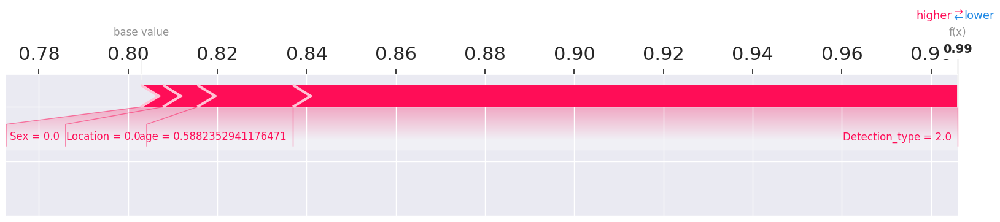

In [75]:
shap_plot(1660)

In [76]:
i=555
shap.force_plot(explainer.expected_value[0], shap_values[0][i], dataX.values[i], feature_names = dataX.columns)

In [77]:
x_test.iloc[1660]

age               0.588235
Sex               0.000000
Detection_type    2.000000
Location          0.000000
Name: 5491, dtype: float64

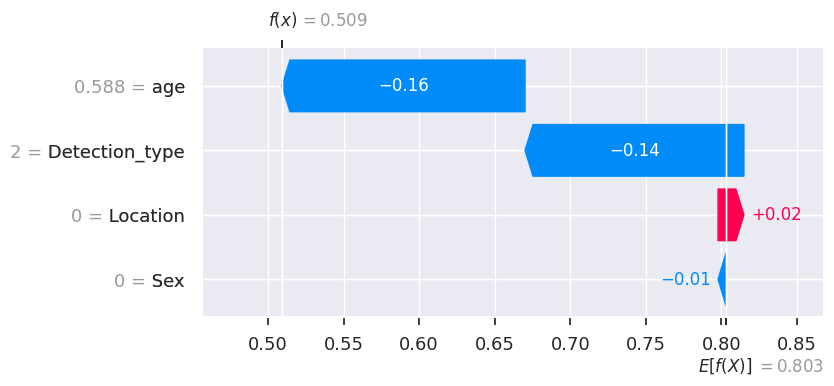

In [78]:
row = 1660
shap.waterfall_plot(shap.Explanation(values=shap_values[0][row], 
                                        base_values=explainer.expected_value[0], data=x_test.iloc[row],  
                                        feature_names=x_test.columns.tolist()))

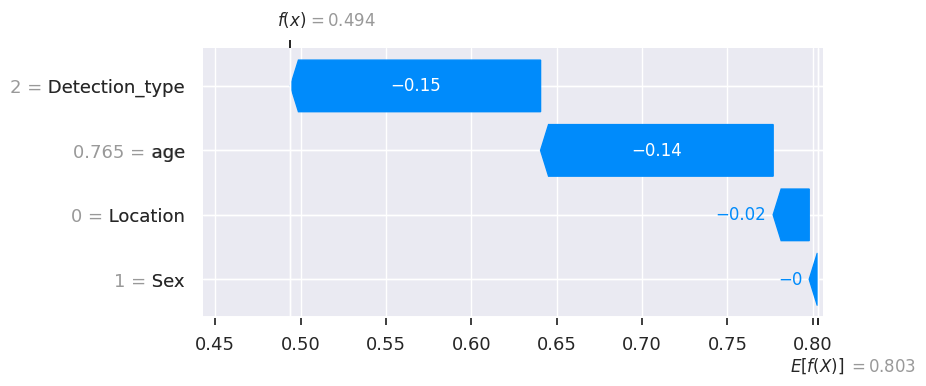

In [79]:
row = 1200
shap.waterfall_plot(shap.Explanation(values=shap_values[0][row], 
                                        base_values=explainer.expected_value[0], data=x_test.iloc[row],  
                                        feature_names=x_test.columns.tolist()))

For Ref- Medium blog on shap https://towardsdatascience.com/explainable-ai-xai-with-shap-multi-class-classification-problem-64dd30f97cea